In [1]:
%run /Desktop/Share/CUDA_DEVICE_setup.py -n 1

using GPU ID:0,



In [2]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = "0" # set as the using GPU ID

# Introduction to Data Augmentation and Transfer Learning

In this project, we will explore two essential techniques in deep learning: **data augmentation** and **transfer learning**. These methods are crucial for enhancing the performance of models, especially when dealing with limited data.

## Data Augmentation
Data augmentation is a strategy to increase the diversity of your training dataset without actually collecting new data. By applying various transformations, such as rotations, flips, and shifts, we can generate new samples from the existing dataset. This helps in improving the robustness and generalization of the model.

We will use the `Albumentations` library to demonstrate data augmentation techniques on a dataset loaded from Hugging Face.

## Transfer Learning
Transfer learning involves taking a pre-trained model on a large dataset and fine-tuning it on a new, smaller dataset. This technique leverages the knowledge learned by the model from the large dataset and applies it to the new task, often resulting in better performance and faster convergence.

In this project, we will:
1. Load a pre-trained model trained on the ImageNet dataset.
3. Fine-tune the saved model on a new dataset from Hugging Face.
4. Demonstrate the impact of transfer learning on the new dataset.

Let's dive into the code and start with loading and preparing our dataset.


# Loading and Preparing the Dataset

First, we will load the dataset from Hugging Face and apply necessary transformations to prepare it for training.

We will be using the `snacks` dataset from Hugging Face, which contains images of different types of snacks. The dataset is divided into training, validation, and test sets. It consists of 20 classes.

## Visualizing the Original Dataset

Before we apply data augmentation, let's visualize the original dataset to understand its composition. We will plot some sample images from each class.

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from datasets import load_dataset
import random

In [4]:
# Load dataset
dataset = load_dataset('Matthijs/snacks', cache_dir ="/Desktop/CodeFolder/PCS/dataset/snacks_dataset")
class_names = dataset['train'].features['label'].names

print(dataset)
print(class_names)

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 4838
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 952
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 955
    })
})
['apple', 'banana', 'cake', 'candy', 'carrot', 'cookie', 'doughnut', 'grape', 'hot dog', 'ice cream', 'juice', 'muffin', 'orange', 'pineapple', 'popcorn', 'pretzel', 'salad', 'strawberry', 'waffle', 'watermelon']


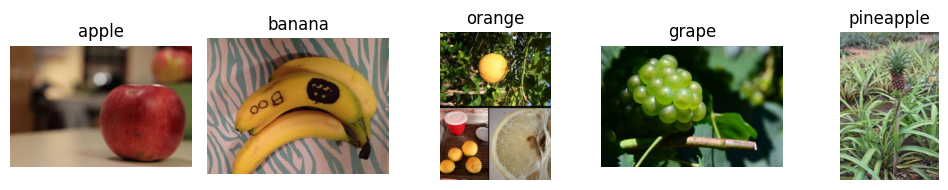

In [5]:
def plot_random_images(dataset, class_names, num_images=5):
    # Set up the plot
    fig, axs = plt.subplots(1, num_images, figsize=(num_images * 2, 2))
    
    # Ensure the test set exists
    test_set = dataset['test']
    
    # Iterate over the number of images to plot
    for i in range(num_images):
        # Randomly select an index from the test set
        rand_idx = random.randint(0, len(test_set) - 1)
        sample = test_set[rand_idx]
        image = sample['image']
        label = sample['label']
        
        # Plot the image
        axs[i].imshow(image)
        axs[i].set_title(class_names[label])
        axs[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Plot random images from the test set
plot_random_images(dataset, class_names)


## Loading and Preparing the Dataset with Transformations

First, we will load the dataset from Hugging Face and apply necessary transformations using Albumentations to prepare it for training.

In [6]:
import torch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor, Normalize, Compose
import albumentations as A
from albumentations.pytorch import ToTensorV2
import copy

In [7]:
# Custom dataset class
class HuggingFaceDataset(Dataset):
    def __init__(self, hf_dataset, transforms=None):
        self.dataset = hf_dataset
        self.transforms = transforms

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        sample = self.dataset[idx]
        image = np.array(sample['image'])
        label = sample['label']
        
        if self.transforms:
            augmented = self.transforms(image=image)
            image = augmented['image']
        
        return image, label

### Use Albumentations to define transformation functions for the train and validation datasets

We use Albumentations to define augmentation pipelines for training and validation datasets. In both pipelines, we first resize an input image, so its smallest size is 256px, then we take a 224px by 224px crop. For the training dataset, we also apply more augmentations to that crop. Next, we will normalize an image. We first divide all pixel values of an image by 255, so each pixel's value will lie in a range `[0.0, 1.0]`. Then we will subtract mean pixel values and divide values by the standard deviation. `mean` and `std` in augmentation pipelines are taken from the [`ImageNet` dataset](http://www.image-net.org/). After that, we will apply `ToTensorV2` that converts a NumPy array to a PyTorch tensor, which will serve as an input to a neural network.

Note that in the validation pipeline we will use `A.CenterCrop` instead of `A.RandomCrop` because we want out validation results to be deterministic (so that they will not depend upon a random location of a crop).

Ref: [What is image augmentation and how it can improve the performance of deep neural networks](https://albumentations.ai/docs/introduction/image_augmentation/)
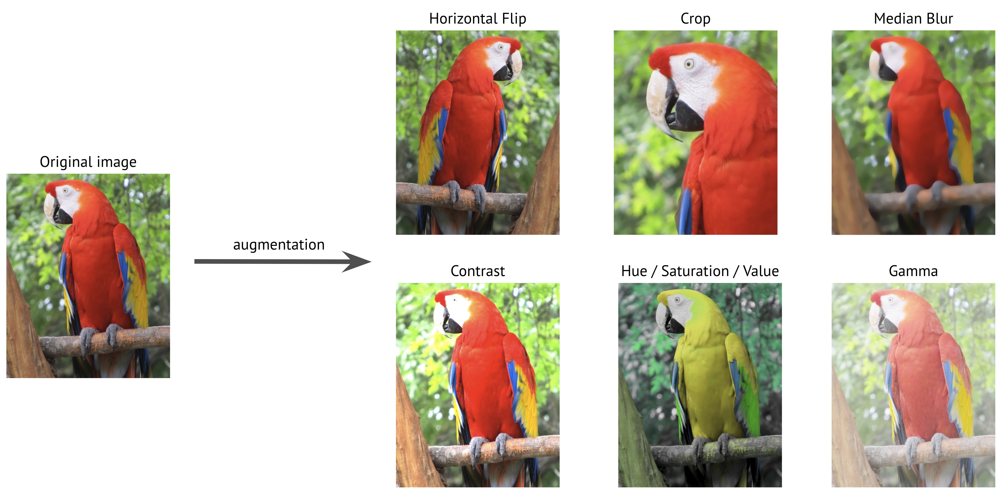

In [8]:
# Define Albumentations transforms
train_transform = A.Compose(
    [
        A.SmallestMaxSize(max_size=256),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
        A.RandomCrop(height=224, width=224),
        A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

val_transform = A.Compose(
    [
        A.SmallestMaxSize(max_size=256),
        A.CenterCrop(height=224, width=224),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

In [9]:
# Create the PyTorch datasets
train_dataset = HuggingFaceDataset(dataset['train'], transforms=train_transform)
val_dataset = HuggingFaceDataset(dataset['validation'], transforms=val_transform)
test_dataset = HuggingFaceDataset(dataset['test'], transforms=val_transform)

In [10]:
# Visualization function for augmented dataset
def visualize_augmentations(dataset, idx=0, samples=10, cols=5):
    dataset = copy.deepcopy(dataset)
    dataset.transforms = A.Compose([t for t in dataset.transforms if not isinstance(t, (A.Normalize, ToTensorV2))])
    rows = samples // cols
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(12, 6))
    for i in range(samples):
        image, _ = dataset[idx]
        ax.ravel()[i].imshow(image)
        ax.ravel()[i].set_axis_off()
    plt.tight_layout()
    plt.show()

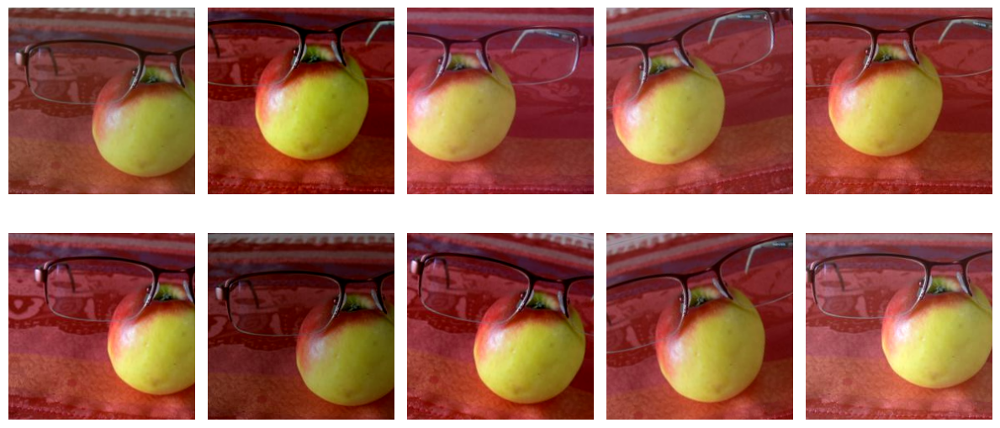

In [11]:
# Visualize augmentations
visualize_augmentations(train_dataset, idx=1, samples=10, cols=5)

In [12]:
# Create the DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Transfer Learning with ResNet18

We will use a pretrained ResNet18 model from torchvision, which is trained on ImageNet, and fine-tune it on our snacks dataset.

In [13]:
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim
from torchinfo import summary

In [14]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [15]:
# Load the pretrained ResNet18 model
model = models.resnet18(pretrained=True)

# Modify the classifier to fit the number of classes in the snacks dataset
num_classes = 20
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Move the model to the appropriate device
model = model.to(device)

# Print the model architecture using torchinfo
summary(model, input_size=(1, 3, 128, 128))


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 20]                   --
├─Conv2d: 1-1                            [1, 64, 64, 64]           9,408
├─BatchNorm2d: 1-2                       [1, 64, 64, 64]           128
├─ReLU: 1-3                              [1, 64, 64, 64]           --
├─MaxPool2d: 1-4                         [1, 64, 32, 32]           --
├─Sequential: 1-5                        [1, 64, 32, 32]           --
│    └─BasicBlock: 2-1                   [1, 64, 32, 32]           --
│    │    └─Conv2d: 3-1                  [1, 64, 32, 32]           36,864
│    │    └─BatchNorm2d: 3-2             [1, 64, 32, 32]           128
│    │    └─ReLU: 3-3                    [1, 64, 32, 32]           --
│    │    └─Conv2d: 3-4                  [1, 64, 32, 32]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 32, 32]           128
│    │    └─ReLU: 3-6                    [1, 64, 32, 32]           --
│

In [16]:
# Freeze all layers except the classifier
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the classifier layers
for param in model.fc.parameters():
    param.requires_grad = True

In [17]:
# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.001)

In [18]:
# Training function for transfer learning
def train_transfer_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        correct_train = 0
        total_train = 0
        
        # Training loop
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)  # Move data to device
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_accuracy = 100 * correct_train / total_train
        
        # Validation loop
        model.eval()
        running_val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)  # Move data to device
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_val_loss += loss.item()
                
                _, predicted = torch.max(outputs.data, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()
        
        val_loss = running_val_loss / len(val_loader)
        val_accuracy = 100 * correct_val / total_val
        
        print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
              f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")
        model.train()

# Train the model
train_transfer_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=5)


Epoch 1/5, Train Loss: 1.9733, Train Accuracy: 46.75%, Val Loss: 1.2789, Val Accuracy: 66.81%
Epoch 2/5, Train Loss: 1.1723, Train Accuracy: 68.56%, Val Loss: 0.9968, Val Accuracy: 72.25%
Epoch 3/5, Train Loss: 0.9433, Train Accuracy: 74.56%, Val Loss: 0.8765, Val Accuracy: 74.35%
Epoch 4/5, Train Loss: 0.8721, Train Accuracy: 75.18%, Val Loss: 0.8474, Val Accuracy: 74.66%
Epoch 5/5, Train Loss: 0.7949, Train Accuracy: 77.82%, Val Loss: 0.8108, Val Accuracy: 75.60%


## Evaluating the Transfer Learning Model

Finally, we will evaluate the fine-tuned model on the test set.

In [19]:
# Test function for transfer learning
def test_transfer_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)  # Move data to device
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    print(f"Test Accuracy: {accuracy:.2f}%")

test_transfer_model(model, test_loader)


Test Accuracy: 77.84%


## Visualizing Attention with Grad-CAM

We will use Grad-CAM to visualize what parts of an image a convolutional neural network is focusing on for its predictions.

In [20]:
import cv2

In [21]:
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [22]:
# Unfreeze all layers
for param in model.parameters():
    param.requires_grad = True

In [23]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_layers()

    def hook_layers(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate_cam(self, input_image, target_class):
        self.model.zero_grad()
        output = self.model(input_image)
        class_loss = output[0, target_class]
        class_loss.backward(retain_graph=True)

        gradients = self.gradients
        activations = self.activations

        # Check if gradients and activations are captured
        if gradients is None or activations is None:
            raise ValueError("Gradients or activations are not captured correctly")

        gradients = gradients.cpu().data.numpy()[0]
        activations = activations.cpu().data.numpy()[0]

        pooled_grads = np.mean(gradients, axis=(1, 2))
        cam = np.zeros(activations.shape[1:], dtype=np.float32)

        for i, w in enumerate(pooled_grads):
            cam += w * activations[i]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, input_image.shape[2:][::-1])
        cam -= np.min(cam)
        cam /= np.max(cam)
        return cam

In [24]:
def show_cam_on_image(img, mask, intensity=0.5):
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap * intensity + np.float32(img)
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)

In [25]:
# Function to generate and visualize CAM
def visualize_grad_cam(grad_cam, input_image, target_class, intensity=0.5):
    cam = grad_cam.generate_cam(input_image, target_class)
    
    # Convert the input image to numpy array
    img = input_image.cpu().numpy()[0].transpose(1, 2, 0)
    img = (img - np.min(img)) / (np.max(img) - np.min(img))  # Normalize

    # Show the original image and CAM
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    # Show CAM
    cam_img = show_cam_on_image(img, cam, intensity)
    plt.subplot(1, 2, 2)
    plt.imshow(cam_img)
    plt.title('Grad-CAM')
    plt.axis('off')

    plt.show()

In [26]:
# Function to visualize activation maps
def visualize_activations(activations):
    num_activations = activations.shape[0]
    avg_activation = np.mean(activations, axis=0)
    avg_activation = (avg_activation - np.min(avg_activation)) / (np.max(avg_activation) - np.min(avg_activation))  # Normalize
    plt.imshow(avg_activation, cmap='gray')
    plt.axis('off')
    plt.title('Average Activation Map')
    plt.show()

In [27]:
# Function to initialize Grad-CAM for a specific layer
def initialize_grad_cam(model, layer_name):
    target_layer = dict([*model.named_modules()])[layer_name]
    grad_cam = GradCAM(model, target_layer)
    return grad_cam

# Function to visualize activations from a specific layer
def visualize_layer_activations(layer_name, input_image):
    activations = dict([*model.named_modules()])[layer_name](input_image).cpu().data.numpy()[0]
    visualize_activations(activations)

In [28]:
# Get a batch of images from the test loader
dataiter = iter(test_loader)

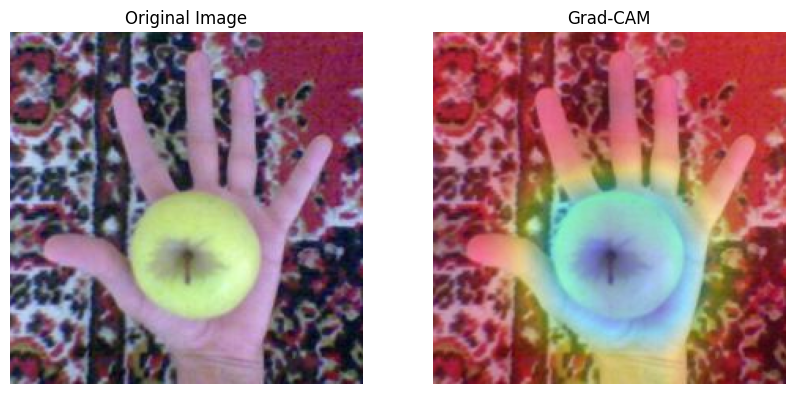

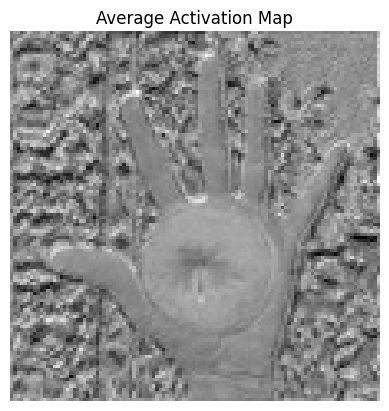

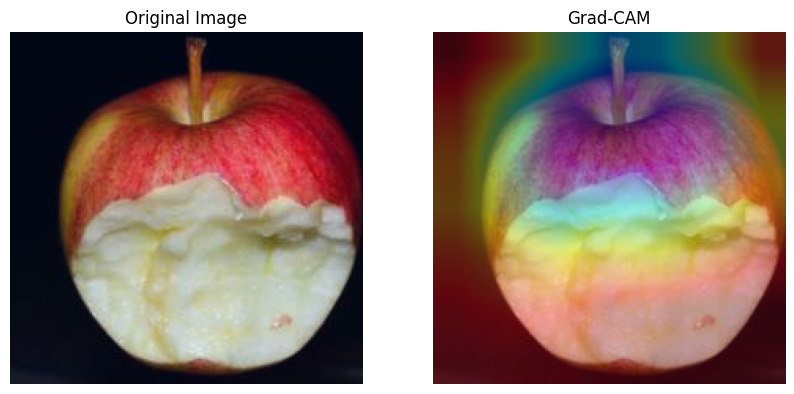

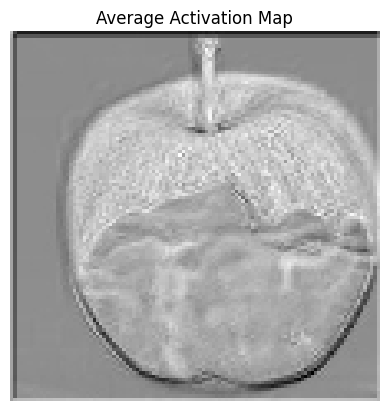

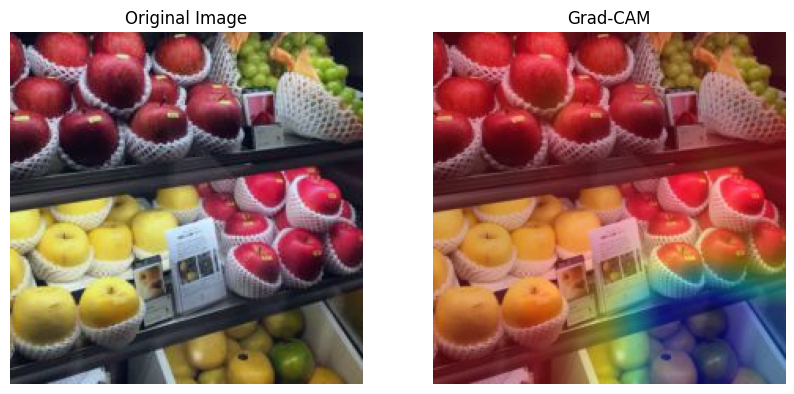

...

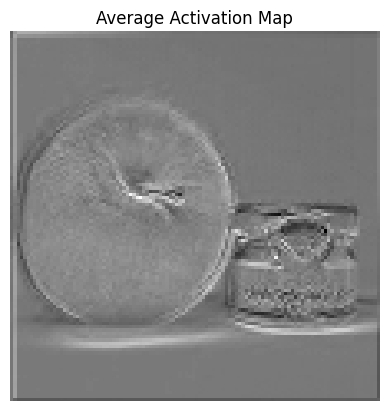

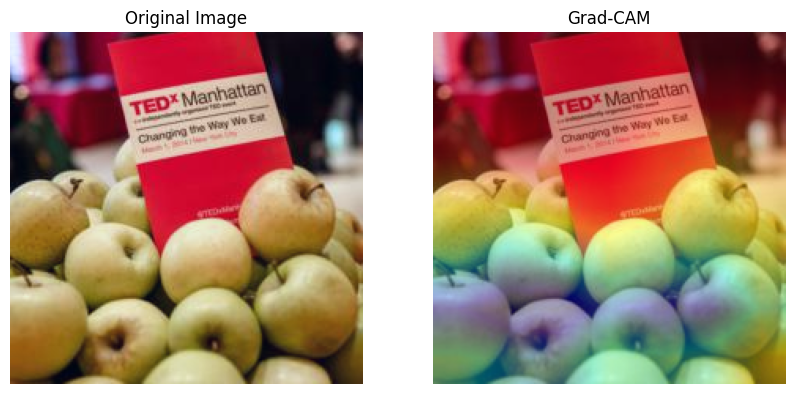

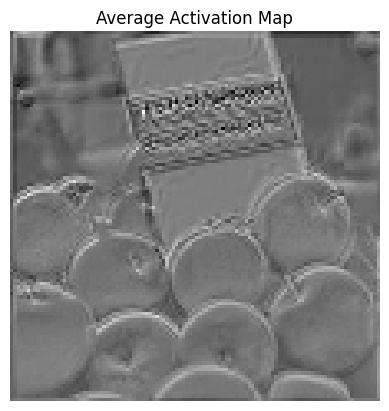

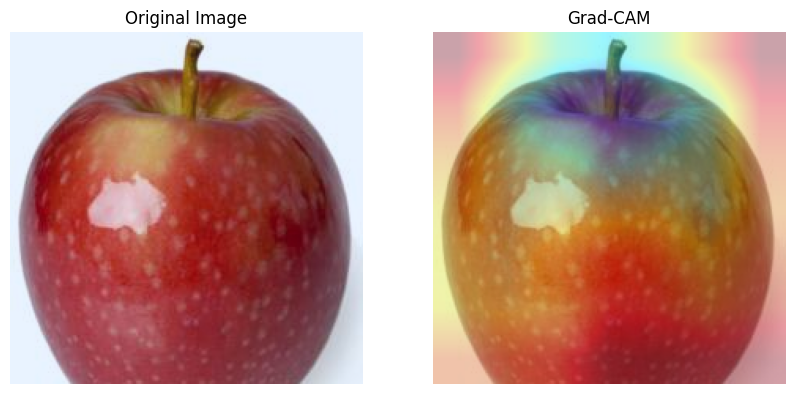

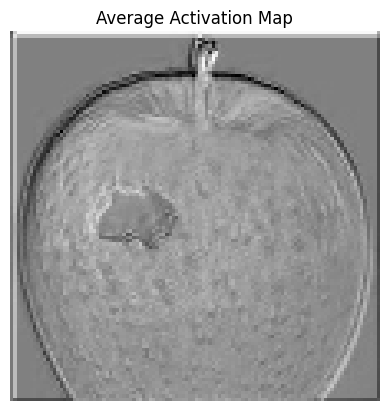

In [29]:
images, labels = dataiter.next()
images, labels = images.to(device), labels.to(device)

# Randomly select three indices from the batch
random_indices = random.sample(range(len(images)), 10)

# Visualize Grad-CAM and activations for the randomly selected images
for idx in random_indices:
    input_image = images[idx].unsqueeze(0)
    target_class = labels[idx].item()
    
    # Visualize Grad-CAM for a specific layer (e.g., last convolutional layer)
    grad_cam = initialize_grad_cam(model, 'layer4.1.conv2')
    visualize_grad_cam(grad_cam, input_image, target_class)
    
    # Visualize activation maps for the first convolutional layer
    visualize_layer_activations('conv1', input_image)
